In [6]:
import os

def findfile(name, path):
    for dirpath, dirname, filename in os.walk(path):
        if name in filename:
            return os.path.join(dirpath, name)
filepath = findfile("tensorflow_datasets", "/")
print(filepath)

None


In [1]:
import torch

print(torch.__version__)

1.12.1


In [1]:
import os, sys
import wandb
sys.path.append('/content/content/StyleGAN2')
from model import pggan, stylegan2

import torch
from torch.nn import functional as F
import numpy as np
import matplotlib.pyplot as plt

device = torch.device("cuda:0" if (torch.cuda.is_available()) else "cpu")

model_path = '/content/content/StyleGAN2/stylegan/stylegan2_cat256.pth'
# model_path = '/content/content/StyleGAN2/stylegan/stylegan2_church256.pth'
G, D = stylegan2(path=model_path, res=256)
G.to(device)
D.to(device)
print('c')

c


In [6]:
from torch import nn
visualisation = {}

def hook_fn(m, i, o):
  visualisation[m] = o 

def get_all_layers(net):
  for name, layer in net._modules.items():
    #If it is a sequential, don't register a hook on it
    # but recursively register hook on all it's module children
    if isinstance(layer, nn.Sequential):
      get_all_layers(layer)
    else:
      # it's a non sequential. Register a hook
      layer.register_forward_hook(hook_fn)

get_all_layers(G)

  
out = G(z)

In [6]:
def g_nonsaturating_loss(fake_pred):
    loss = F.softplus(-fake_pred).mean()
    return loss

In [52]:
z = torch.randn(4, 512, device=device)


def feature_map_gradient(G, z, wandb=False):
    G.eval()
    D.eval()

    var = {}
    grads = {}
    dic = G.mapping(z)
    const = dic['z']
    w = dic['w']
    wp = G.truncation(w)
    x = G.synthesis.early_layer(wp[:, 0])
    
    for layer_idx in range(G.synthesis.num_layers - 1):
        x, style = G.synthesis.__getattr__(f'layer{layer_idx}')\
                                        (x, wp[:, layer_idx])
        if layer_idx % 2 == 0:
            temp, style = G.synthesis.__getattr__(f'output{layer_idx // 2}')\
                                                (x, wp[:, layer_idx + 1])
            if layer_idx == 0:
                image = temp
            else:
                image = temp + G.synthesis.upsample(image)
        name = f'layer{layer_idx}'
        tmp = x
        tmp.retain_grad()
        grads[name] = tmp

        var[name] = torch.var(x,axis=1)
    out = G.synthesis.final_activate(image)# * 127.5 + 127.5
    fake_pred = D(out)
    g_loss = g_nonsaturating_loss(fake_pred)
    g_loss.backward()
    for k in grads.keys():
        grads[k] = grads[k].grad
    return grads, var, out



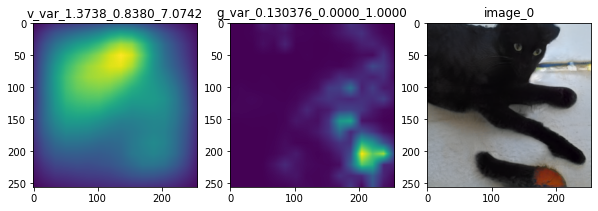

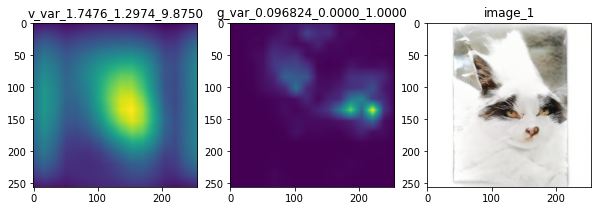

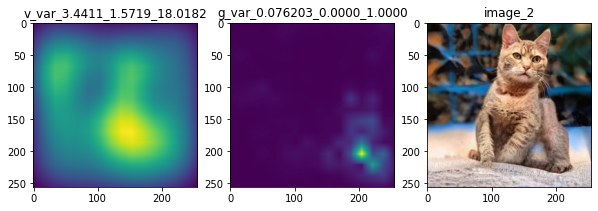

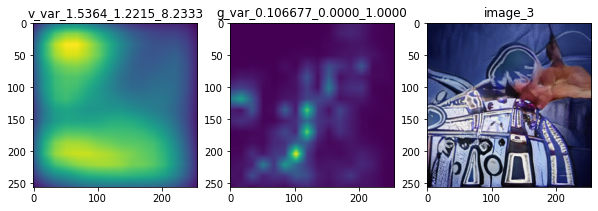

In [71]:
z = torch.randn(4, 512, device=device)
g, v, i = feature_map_gradient(G,z)


idx_=1
img = i.permute(0,2,3,1).detach().cpu().numpy()
img = (img+1)*127.5
img = img.astype(int)
for x in range(4):
    map=[]
    for idx in range(3,13):
        tmp = v['layer{}'.format(idx)][x][np.newaxis,np.newaxis,...]
        # tmp = torch.Tensor(tmp)
        # print(tmp.shape)
        tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
        map.append(tmp.detach().cpu().numpy())
    v_img = np.sum(map[0][0], axis=0)
    map=[]
    for idx in range(3,13):
        tmp = g['layer{}'.format(idx)][x]
        tmp = torch.var(tmp,axis=0)[np.newaxis,np.newaxis,...]
        tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
        map.append(tmp.detach().cpu().numpy())
    g_img = np.sum(map[0][0], axis=0)
    g_img = (g_img - g_img.min()) / (g_img.max() - g_img.min()) 
    plot_img = img[x]
    row = 4
    col = 3
    fig = plt.figure(figsize=(10,60))
    # for x ,(g, d) in enumerate(zip(g_img,d_img)):   
    plt.subplot(row,col,idx_)  
    plt.title('v_var_{:.4f}_{:.4f}_{:.4f}'.format(np.std(v_img),v_img.min(),v_img.max()))
    plt.imshow(v_img)
    plt.subplot(row,col,idx_+1)
    plt.title('g_var_{:.6f}_{:.4f}_{:.4f}'.format(np.std(g_img),g_img.min(),g_img.max()))
    plt.imshow(g_img)
    plt.subplot(row,col,idx_+2)
    plt.title('image_{}'.format(x))
    plt.imshow(plot_img)
    idx_+=3

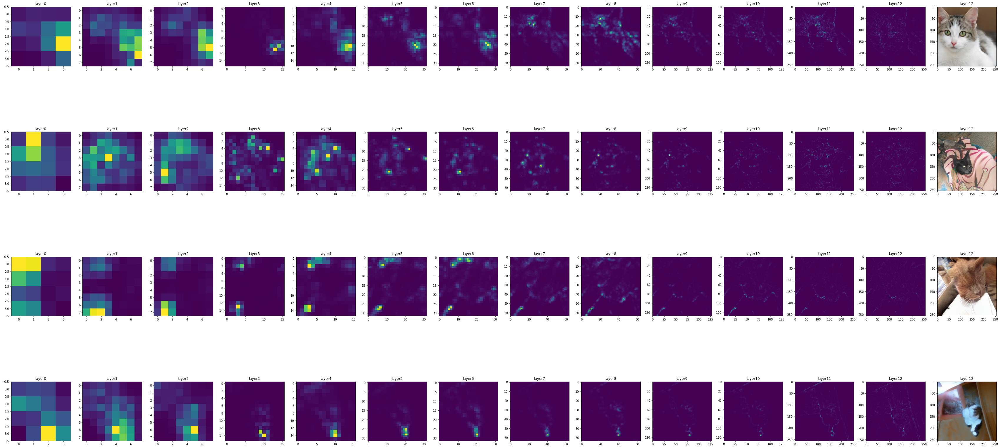

In [97]:
z = torch.randn(4, 512, device=device)
g, v, i = feature_map_gradient(G,z)


idx_=1
img = i.permute(0,2,3,1).detach().cpu().numpy()
img = (img+1)*127.5
img = img.astype(int)


row = 4
col = 14
idx_=1
plt.figure(figsize=(60,30))
for idx in range(row):
    for x in range(13):
        tmp = g['layer{}'.format(x)][idx]
        tmp = torch.var(tmp,axis=0)
        tmp = tmp.detach().cpu().numpy()
        plt.subplot(row,col,idx_)
        plt.title('layer{}'.format(x))
        plt.imshow(tmp)
        idx_ += 1
    plt.subplot(row,col,idx_)
    plt.title('layer{}'.format(x))
    plt.imshow(img[idx])
    idx_ += 1

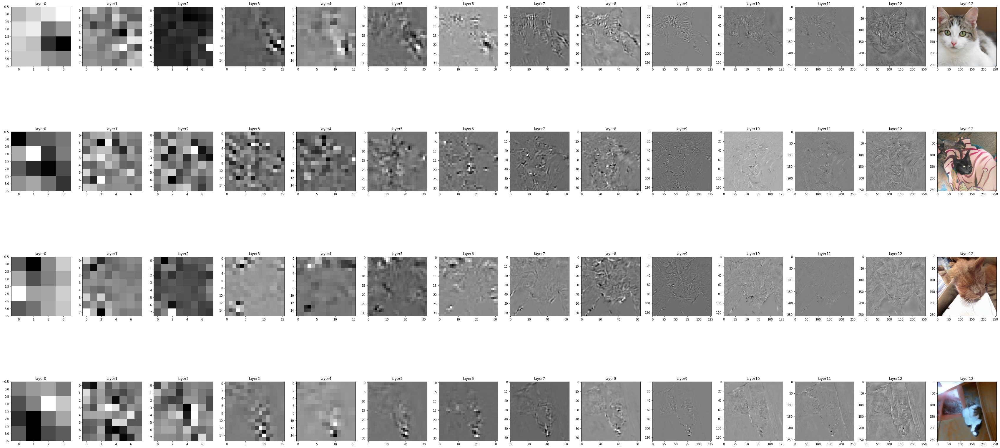

In [99]:
idx_=1
img = i.permute(0,2,3,1).detach().cpu().numpy()
img = (img+1)*127.5
img = img.astype(int)


row = 4
col = 14
idx_=1
plt.figure(figsize=(60,30))
for idx in range(row):
    for x in range(13):
        tmp = g['layer{}'.format(x)][idx]
        tmp = torch.mean(tmp,axis=0)
        tmp = tmp.detach().cpu().numpy()
        plt.subplot(row,col,idx_)
        plt.title('layer{}'.format(x))
        plt.imshow(tmp,cmap='gray')
        idx_ += 1
    plt.subplot(row,col,idx_)
    plt.title('layer{}'.format(x))
    plt.imshow(img[idx])
    idx_ += 1



---



---



---



In [64]:
out = []
def g_nonsaturating_loss(fake_pred):
    loss = F.softplus(-fake_pred).mean()
    return loss
for x in range(1000):
    G.eval()
    D.eval()
    z = torch.randn(4, 512, device=device)
    dic = G.mapping(z)
    const = dic['z']
    wp = dic['w']


    grad_X = wp.detach()
    grad_X.requires_grad = True

    fake_img = G(grad_X)
    fake_pred = D(fake_img['image'])
    g_loss = g_nonsaturating_loss(fake_pred)
    g_loss.backward()

    grad = grad_X.grad.data

    img = fake_img['image'].permute(0,2,3,1).detach().cpu().numpy()
    img = (img+1) * 127.5
    img = img.astype(int)
    np_grad = grad.cpu().numpy()
    np_w = wp.detach().cpu().numpy()
    grads = np.std(np_grad,axis=1)
    for (w, gr,im) in zip(np_w,grads,img):
        out.append((w,gr,im))        

KeyboardInterrupt: ignored

In [63]:
wp.detach().cpu().numpy().shape

(4, 512)

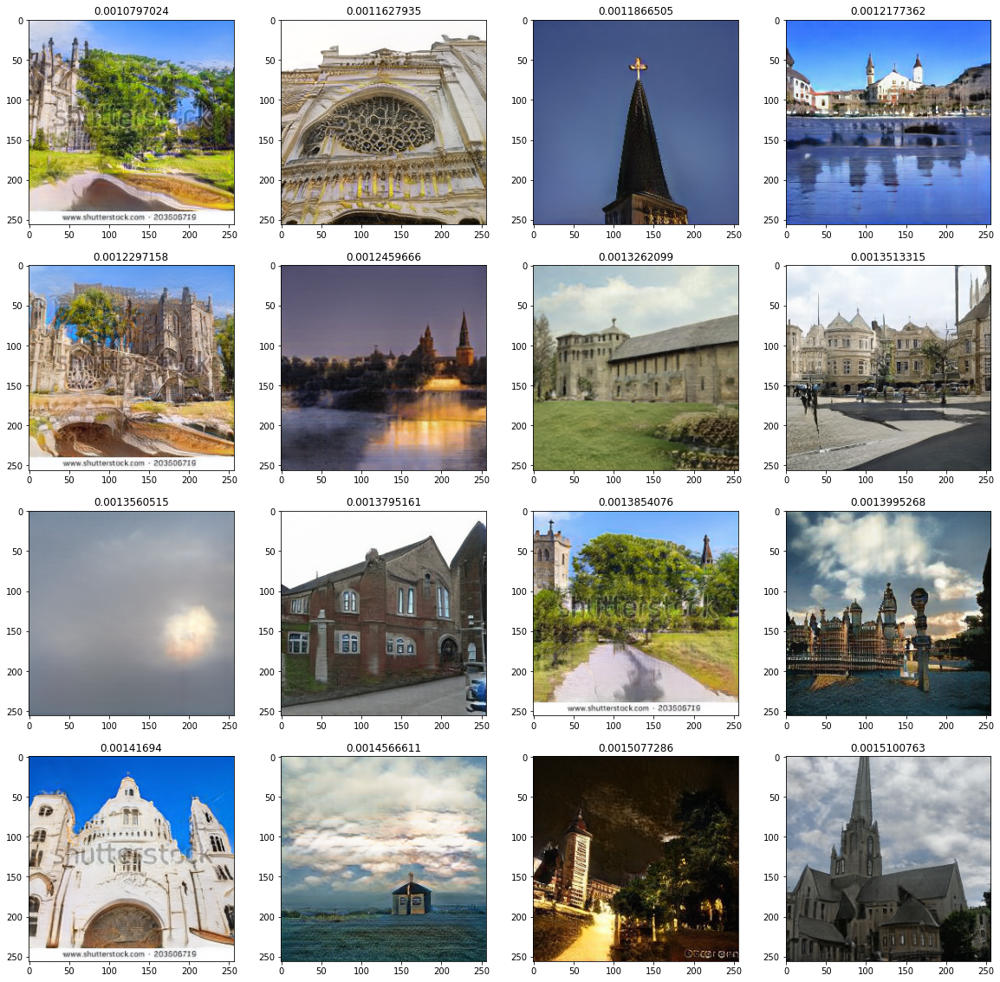

In [41]:
sort_out =  sorted(out, key=lambda x:x[0]) 
row = 4
col = 4
plt.figure(figsize=(20,20))
idx = 1
for v,img in sort_out[:16]:
    plt.subplot(row,col,idx)
    plt.title(v)
    plt.imshow(img)
    idx +=1
# plt.imshow((sort_out[2][1]))

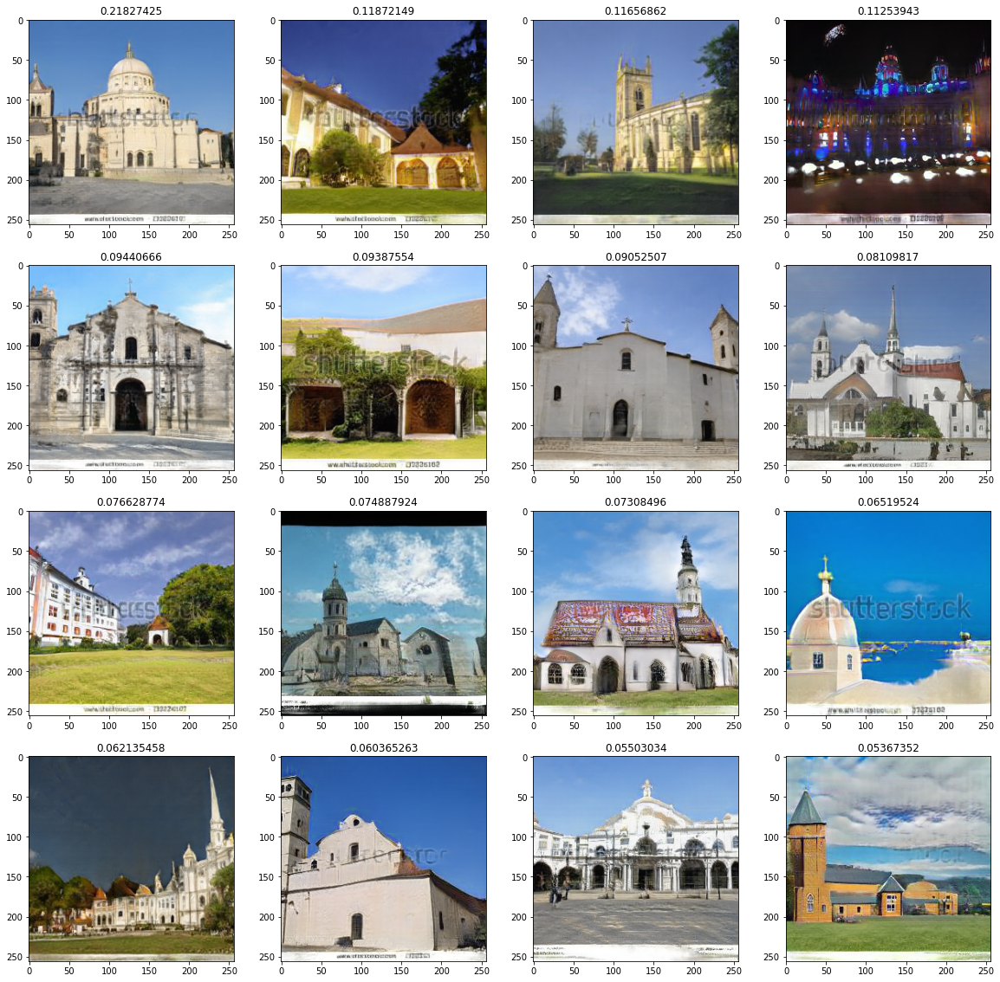

In [42]:
sort_out =  sorted(out, key=lambda x:x[0], reverse=True)
row = 4
col = 4
plt.figure(figsize=(20,20))
idx = 1
for v,img in sort_out[:16]:
    plt.subplot(row,col,idx)
    plt.title(v)
    plt.imshow(img)
    idx +=1
# plt.imshow((sort_out[2][1]))

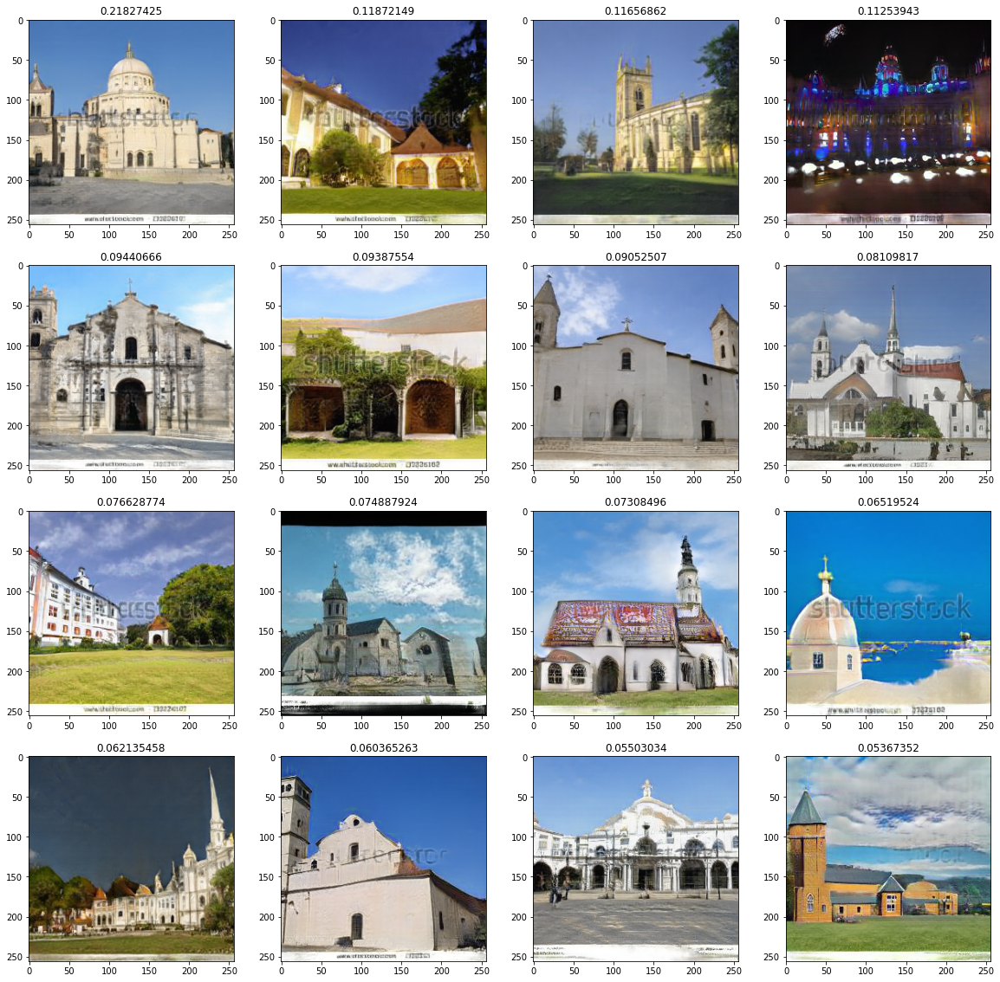

In [43]:
sort_out =  sorted(out, key=lambda x:abs(1- x[0])) 
row = 4
col = 4
plt.figure(figsize=(20,20))
idx = 1
for v,img in sort_out[:16]:
    plt.subplot(row,col,idx)
    plt.title(v)
    plt.imshow(img)
    idx +=1
# plt.imshow((sort_out[2][1]))

In [8]:
def plot_feature_var(g_map,d_map):
    idx_=1
    for x in range(4):
        map=[]
        for idx in range(3,13):
            tmp = out['layer{}_mean'.format(idx)][x][np.newaxis,np.newaxis,:,:]
            tmp = torch.Tensor(tmp)
            # print(tmp.shape)
            tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
            map.append(tmp.detach().cpu().numpy())
        g_img = np.sum(map[0][0], axis=0)
        map=[]
        for idx in range(2,4):
            tmp = d_map['block{}_var'.format(idx)][x][np.newaxis,np.newaxis,:,:]
            tmp = torch.Tensor(tmp)
            tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
            map.append(tmp.detach().cpu().numpy())
        d_img = np.sum(map[0][0], axis=0)
        # print(g_img.shape,d_img.shape)
        row = 4
        col = 3
        fig = plt.figure(figsize=(10,60))
        # for x ,(g, d) in enumerate(zip(g_img,d_img)):   
        plt.subplot(row,col,idx_)  
        plt.title('g_var_{}_{:.4f}_{:.4f}'.format(x,g_img.min(),g_img.max()))
        plt.imshow(g_img)
        plt.subplot(row,col,idx_+1)
        plt.title('d_var_{}_{:.4f}_{:.4f}'.format(x,d_img.min(),d_img.max()))
        plt.imshow(d_img)
        plt.subplot(row,col,idx_+2)
        plt.title('image_{}'.format(x))
        plt.imshow(out['image'][x])
        idx_+=3

z = torch.randn(4, 512, device=device)
out,imgs = gen_foward(G, z)
pred = dis_foward(D,imgs)
# plot_feature_var(out,pred)

In [16]:
from torch.nn import functional as F


def d_logistic_loss(real_pred, fake_pred):
    real_loss = F.softplus(-real_pred)
    fake_loss = F.softplus(fake_pred)

    return real_loss.mean() + fake_loss.mean()

def d_r1_loss(real_pred, real_img):
    with conv2d_gradfix.no_weight_gradients():
        grad_real, = autograd.grad(
            outputs=real_pred.sum(), inputs=real_img, create_graph=True
        )
    grad_penalty = grad_real.pow(2).reshape(grad_real.shape[0], -1).sum(1).mean()

    return grad_penalty




# out,imgs = gen_foward(G, z)
# grad_X = imgs.detach()
# grad_X.requires_grad = True
# D.eval()


# pred = D(grad_X)
# print('pred:',pred)
# # sel_nodes_shape = torch.zeros
# fake_loss = F.softplus(pred)
# print('fake loss:',fake_loss)
# fake_loss.mean().backward()

# # grad = grad_X.g,data

In [41]:
out

(4, 512)

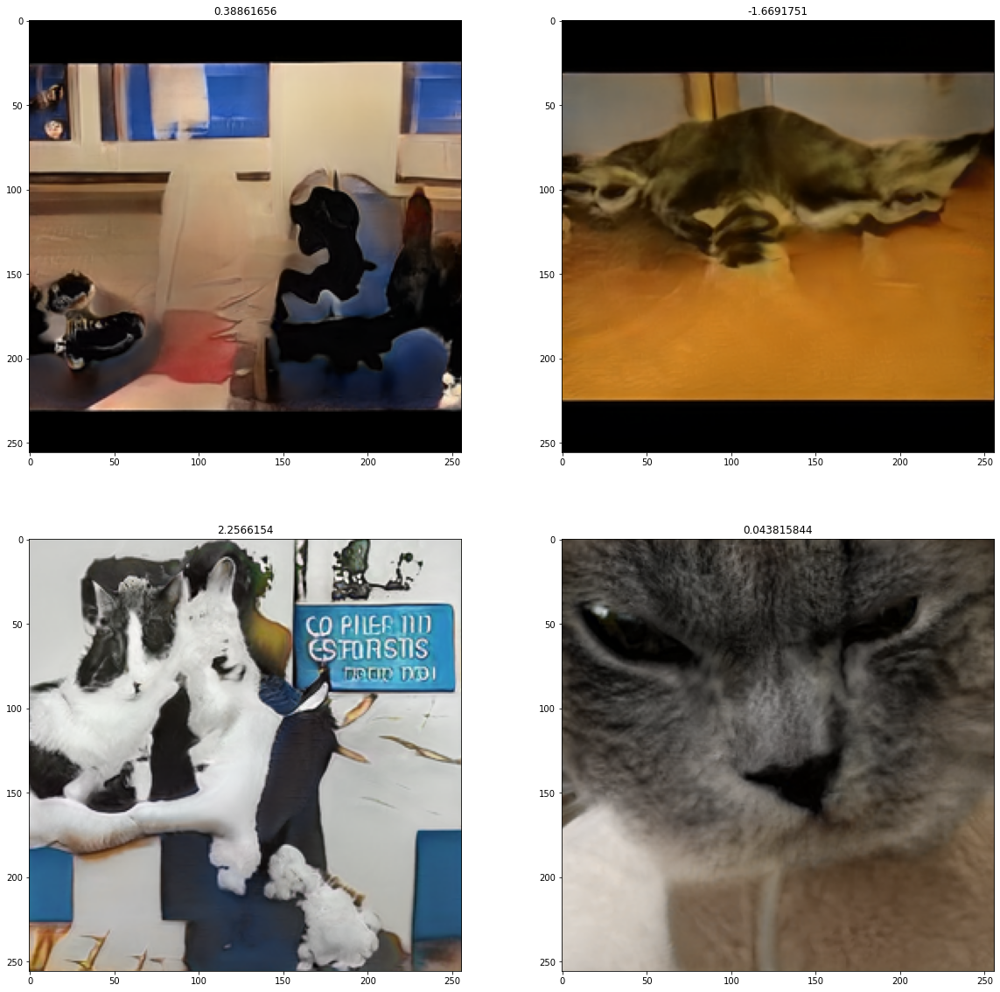

In [14]:
fake_img.keys()

dict_keys(['z', 'label', 'w', 'wp', 'style00', 'output_style0', 'style01', 'style02', 'output_style1', 'style03', 'style04', 'output_style2', 'style05', 'style06', 'output_style3', 'style07', 'style08', 'output_style4', 'style09', 'style10', 'output_style5', 'style11', 'style12', 'output_style6', 'image'])

In [ ]:
def gen_foward(G, z, wandb=False):
    feature_dict = {}
    dic = G.mapping(z)
    const = dic['z']
    w = dic['w']
    wp = G.truncation(w)
    wp.requires_grad = True
    x = G.synthesis.early_layer(wp[:, 0])
    for layer_idx in range(G.synthesis.num_layers - 1):
        x, style = G.synthesis.__getattr__(f'layer{layer_idx}')\
                                        (x, wp[:, layer_idx])
        # results[f'style{layer_idx:02d}'] = style
        if layer_idx % 2 == 0:
            temp, style = G.synthesis.__getattr__(f'output{layer_idx // 2}')\
                                                (x, wp[:, layer_idx + 1])
            # results[f'output_style{layer_idx // 2}'] = style
            if layer_idx == 0:
                image = temp
            else:
                image = temp + G.synthesis.upsample(image)
        name = f'layer{layer_idx}'
        var = torch.var(x,axis=1)
        if wandb:
            var = torch.nan_to_num(var).detach().cpu().numpy()
            feature_dict[name+'_var'] = [wandb.Image(img) for img in var]
        else:
            feature_dict[name+'_var'] = var

        means = torch.mean(x,axis=1)
        if wandb:
            means = torch.nan_to_num(means).detach().cpu().numpy()
            feature_dict[name+'_mean'] = [wandb.Image(img) for img in means]
        else:
            feature_dict[name+'_mean'] = means
    out = G.synthesis.final_activate(image) * 127.5 + 127.5
    imgs = out.permute(0,2,3,1).detach().cpu().numpy().astype(int)
    if wandb:
        imgs = [wandb.Image(img) for img in imgs]
    else:
        imgs = [(img) for img in imgs]
    feature_dict['image'] = imgs
    return feature_dict, out

In [ ]:
!python3 lsun/data.py export http://dl.yf.io/lsun/objects/cat.zip --out_dir /content/data

Exporting http://dl.yf.io/lsun/objects/cat.zip to /content/data
Traceback (most recent call last):
  File "lsun/data.py", line 87, in <module>
    main()
  File "lsun/data.py", line 83, in main
    export_images(lmdb_path, args.out_dir, args.flat)
  File "lsun/data.py", line 36, in export_images
    max_readers=100, readonly=True)
lmdb.Error: http://dl.yf.io/lsun/objects/cat.zip: No such file or directory


In [ ]:
from torchvision import datasets as dset
import torchvision.transforms as transforms


class norm_tanh(object):
    def __call__(self,sample):
        return (sample-0.5)*2


transform=transforms.Compose([transforms.Resize(256),
                              transforms.CenterCrop(256),
                              transforms.ToTensor(),
                              norm_tanh()])
cat = LSUN(root='/content/data/cat',
                transform=transform)

NameError: ignored

In [ ]:
from sklearn.datasets import make_blobs

seed = 212

np.random.seed(seed=seed)
X, Y = make_blobs(n_samples=500, n_features=2, cluster_std=2, shuffle=True)
x_train, x_test, y_train, y_test = X[:450, :], X[-50:, :], Y[:450], Y[-50:]
def blob_label(y, label, loc): # assign labels
    target = np.copy(y)
    for l in loc:
        target[y == l] = label
    return target

blob_label(y_test, 1, [1,2,3])

array([1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 1, 1])

In [ ]:
y_test

array([2, 1, 2, 0, 2, 1, 1, 1, 0, 2, 0, 0, 0, 0, 1, 1, 2, 2, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 2, 0, 2, 2, 0, 0, 1, 1, 0, 1, 2, 0, 0, 0, 0, 1,
       1, 0, 0, 1, 2, 1])

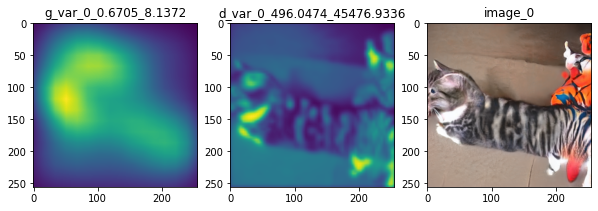

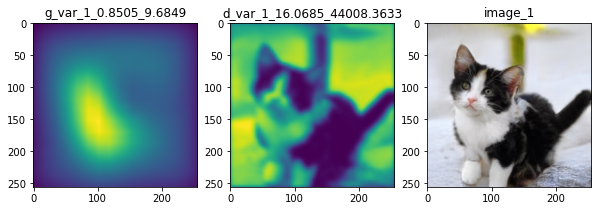

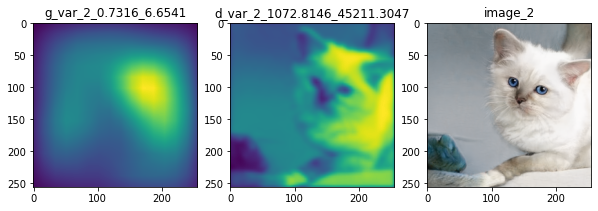

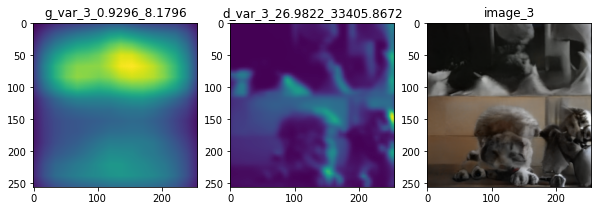

In [ ]:
z = torch.randn(4, 512, device=device)
out,imgs = gen_foward(G, z)
pred = dis_foward(D,imgs)
plot_feature_var(out,pred)

In [ ]:
# wandb.init(reinit=True, project='Stylegan2')
# wandb.run.name = 'Explore Feature Map'

iter = 1
fixed_noise = torch.randn(16, 512, device=device)
def get_featuremap(z,wandb=False):
    feature_dict = {}
    # z = torch.randn(16, 512, device=device)
    dic = G.mapping(z)


    const = dic['z']
    w = dic['w']
    wp = G.truncation(w)


    x = G.synthesis.early_layer(wp[:, 0])
    for layer_idx in range(G.synthesis.num_layers - 1):
        x, style = G.synthesis.__getattr__(f'layer{layer_idx}')\
                                        (x, wp[:, layer_idx])
        # results[f'style{layer_idx:02d}'] = style
        if layer_idx % 2 == 0:
            temp, style = G.synthesis.__getattr__(f'output{layer_idx // 2}')\
                                                (x, wp[:, layer_idx + 1])
            # results[f'output_style{layer_idx // 2}'] = style
            if layer_idx == 0:
                image = temp
            else:
                image = temp + G.synthesis.upsample(image)
        name = f'layer{layer_idx}'
        var = torch.var(x,axis=1)
        var = torch.nan_to_num(var).detach().cpu().numpy()
        if wandb:
            feature_dict[name+'_var'] = [wandb.Image(img) for img in var]
        else:
            feature_dict[name+'_var'] = [(img) for img in var]

        means = torch.mean(x,axis=1)
        means = torch.nan_to_num(means).detach().cpu().numpy()
        if wandb:
            feature_dict[name+'_mean'] = [wandb.Image(img) for img in means]
        else:
            feature_dict[name+'_mean'] = [(img) for img in means]
    imgs = G.synthesis.final_activate(image) * 127.5 + 127.5
    imgs = imgs.permute(0,2,3,1).detach().cpu().numpy().astype(int)
    if wandb:
        imgs = [wandb.Image(img) for img in imgs]
    else:
        imgs = [(img) for img in imgs]
    feature_dict['Image'] = imgs
    return feature_dict
#     wandb.log(feature_dict)
# wandb.finish()
feature_map = get_featuremap(fixed_noise)

RuntimeError: ignored

In [ ]:
# /torchvision/datasets/vision.py 
from torchvision.datasets.vision import VisionDataset
import io
import os.path
import pickle
import string
from collections.abc import Iterable
from typing import Any, Callable, cast, List, Optional, Tuple, Union

from PIL import Image

class LSUN(VisionDataset):
    """`LSUN <https://www.yf.io/p/lsun>`_ dataset.

    You will need to install the ``lmdb`` package to use this dataset: run
    ``pip install lmdb``

    Args:
        root (string): Root directory for the database files.
        classes (string or list): One of {'train', 'val', 'test'} or a list of
            categories to load. e,g. ['bedroom_train', 'church_outdoor_train'].
        transform (callable, optional): A function/transform that  takes in an PIL image
            and returns a transformed version. E.g, ``transforms.RandomCrop``
        target_transform (callable, optional): A function/transform that takes in the
            target and transforms it.
    """

    def __init__(
        self,
        root: str,
        classes: Union[str, List[str]] = "train",
        transform: Optional[Callable] = None,
        target_transform: Optional[Callable] = None,
    ) -> None:
        super().__init__(root, transform=transform, target_transform=target_transform)
        self.classes = self._verify_classes(classes)

        # for each class, create an LSUNClassDataset
        self.dbs = []
        for c in self.classes:
            self.dbs.append(LSUNClass(root='/content/data/cat/data.mdb', 
                            transform=transform))

        self.indices = []
        count = 0
        for db in self.dbs:
            count += len(db)
            self.indices.append(count)

        self.length = count

    def _verify_classes(self, classes: Union[str, List[str]]) -> List[str]:
        categories = [
            "bedroom",
            "bridge",
            "church_outdoor",
            "classroom",
            "conference_room",
            "dining_room",
            "kitchen",
            "living_room",
            "restaurant",
            "tower",
            "cat"
        ]
        dset_opts = ["train", "val", "test"]

        try:
            classes = cast(str, classes)
            verify_str_arg(classes, "classes", dset_opts)
            if classes == "test":
                classes = [classes]
            else:
                classes = [c + "_" + classes for c in categories]
        except ValueError:
            if not isinstance(classes, Iterable):
                msg = "Expected type str or Iterable for argument classes, but got type {}."
                raise ValueError(msg.format(type(classes)))

            classes = list(classes)
            msg_fmtstr_type = "Expected type str for elements in argument classes, but got type {}."
            for c in classes:
                verify_str_arg(c, custom_msg=msg_fmtstr_type.format(type(c)))
                c_short = c.split("_")
                category, dset_opt = "_".join(c_short[:-1]), c_short[-1]

                msg_fmtstr = "Unknown value '{}' for {}. Valid values are {{{}}}."
                msg = msg_fmtstr.format(category, "LSUN class", iterable_to_str(categories))
                verify_str_arg(category, valid_values=categories, custom_msg=msg)

                msg = msg_fmtstr.format(dset_opt, "postfix", iterable_to_str(dset_opts))
                verify_str_arg(dset_opt, valid_values=dset_opts, custom_msg=msg)

        return classes

    def __getitem__(self, index: int) -> Tuple[Any, Any]:
        """
        Args:
            index (int): Index

        Returns:
            tuple: Tuple (image, target) where target is the index of the target category.
        """
        target = 0
        sub = 0
        for ind in self.indices:
            if index < ind:
                break
            target += 1
            sub = ind

        db = self.dbs[target]
        index = index - sub

        if self.target_transform is not None:
            target = self.target_transform(target)

        img, _ = db[index]
        return img, target

    def __len__(self) -> int:
        return self.length

    def extra_repr(self) -> str:
        return "Classes: {classes}".format(**self.__dict__)


In [ ]:
z = fixed_noise[[0,10,14]]#[,:]
# img = G(z)['image'].permute(0,2,3,1).detach().cpu().numpy()[0]
# # img = (img + 1)*127.5
# # img = img.astype(int)
# # plt.imshow(img)

In [ ]:
def plot_img(feature_map,idx):
    row = 13
    col = 3

    fig = plt.figure(figsize=(10,60))
    for x in range(13):
        plt.subplot(row,col,(x)*col+1)
        plt.title('layer{}_mean'.format(x))
        plt.imshow(feature_map['layer{}_mean'.format(x)][idx])
        plt.subplot(row,col,(x)*col+2)
        plt.title('layer{}_var'.format(x))
        plt.imshow(feature_map['layer{}_var'.format(x)][idx]/feature_map['layer{}_var'.format(x)][idx].max())
        plt.subplot(row,col,(x)*col+3)
        plt.title('Image')
        plt.imshow(feature_map['Image'][idx])

In [ ]:
G.synthesis.final_tanh = True

In [ ]:
z = noise[[0,4]]

In [ ]:
inter = []
for v in np.arange(0, 1, 1/20.):
    z_= torch.lerp(z[0],z[1],v)
    inter.append(z_[np.newaxis,:])

In [ ]:
inter = torch.cat(inter,axis=0)

In [ ]:
row = 4
fig = plt.figure(figsize=(10,60))
vars = []
for idx in range(row):
    map = []
    for x in range(3,13):
        tmp = feature_map['layer{}_var'.format(x)][idx][np.newaxis,np.newaxis,:,:]
        tmp = torch.Tensor(tmp)
        tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
        map.append(tmp.numpy())

    # if idx in [3,6,7,8,9,10,15]:
    im = np.sum(map, axis=0)[0][0]
    vars.append((torch.Tensor(im[np.newaxis,:,:])))
    im = im / im.max()
    im = np.where(im>0.0,im,0)
    plt.subplot(row,3,3*idx+1)
    plt.title('var'+str(idx))
    plt.imshow(im)

    plt.subplot(row,3,3*idx+2)
    plt.title('Image')
    plt.imshow(feature_map['Image'][idx])
    rgb_weights = [0.2989, 0.5870, 0.1140]
    gray = feature_map['Image'][idx][...,:3] @ rgb_weights
    s = ((gray/255. - im))

    plt.subplot(row,3,3*idx+3)
    plt.title('difference')
    plt.imshow(s)

['T_destination',
 '__annotations__',
 '__call__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_apply',
 '_backward_hooks',
 '_buffers',
 '_call_impl',
 '_forward_hooks',
 '_forward_pre_hooks',
 '_get_backward_hooks',
 '_get_name',
 '_is_full_backward_hook',
 '_load_from_state_dict',
 '_load_state_dict_post_hooks',
 '_load_state_dict_pre_hooks',
 '_maybe_warn_non_full_backward_hook',
 '_modules',
 '_named_members',
 '_non_persistent_buffers_set',
 '_parameters',
 '_register_load_state_dict_pre_hook',
 '_register_state_dict_hook',
 '_replicate_for_data_parallel',
 '_save_to_state_dict',
 '_slow_forward',
 '_state_dict_hooks',
 '_ver

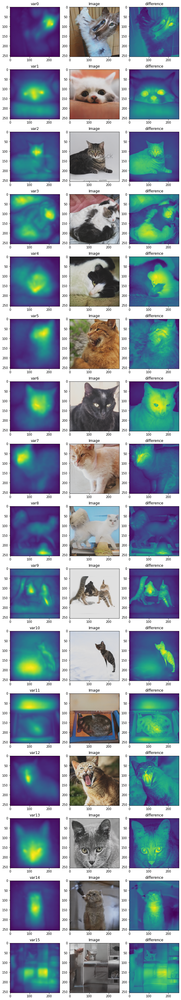

In [ ]:
# idx = 9-10
noise = torch.randn(16, 512, device=device)
# noise = inter[:16]
feature_map = get_featuremap(noise)
row = 16
fig = plt.figure(figsize=(10,60))
vars = []
for idx in range(row):
    map = []
    for x in range(3,13):
        tmp = feature_map['layer{}_var'.format(x)][idx][np.newaxis,np.newaxis,:,:]
        tmp = torch.Tensor(tmp)
        tmp = torch.nn.UpsamplingBilinear2d(size=256)(tmp)
        map.append(tmp.numpy())

    # if idx in [3,6,7,8,9,10,15]:
    im = np.sum(map, axis=0)[0][0]
    vars.append((torch.Tensor(im[np.newaxis,:,:])))
    im = im / im.max()
    im = np.where(im>0.0,im,0)
    plt.subplot(row,3,3*idx+1)
    plt.title('var'+str(idx))
    plt.imshow(im)

    plt.subplot(row,3,3*idx+2)
    plt.title('Image')
    plt.imshow(feature_map['Image'][idx])
    rgb_weights = [0.2989, 0.5870, 0.1140]
    gray = feature_map['Image'][idx][...,:3] @ rgb_weights
    s = ((gray/255. - im))

    plt.subplot(row,3,3*idx+3)
    plt.title('difference')
    plt.imshow(s)

In [ ]:
ins = torch.cat(vars)[:,np.newaxis,:,:]
ins = torch.cat([ins,ins,ins],axis=1)
ins.shape

torch.Size([16, 3, 256, 256])

In [ ]:
maps.shape

torch.Size([12288, 256])

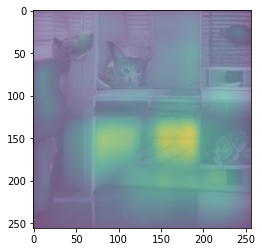

In [ ]:
plt.imshow(feature_map['Image'][idx],alpha=0.5)
plt.imshow(im,alpha=0.5)
plt.show()

In [ ]:
len(low)

0

In [ ]:
import torch
import matplotlib.pyplot as plt

noise = []

for x in range(3):
    noise.append(torch.randn((16,512)))
noise = torch.cat(noise)

In [ ]:
noise.shape

torch.Size([48, 512])

In [ ]:
arti

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


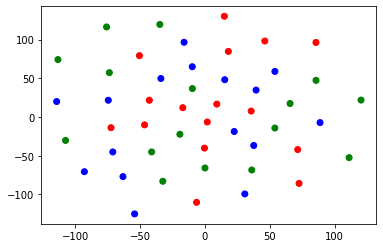

In [ ]:
from sklearn.manifold import TSNE
artifact = [0]*16 + [1]*16 + [2]*16

def get_tsne(noise, artifact):
    dic = {1:'r',
           0:'b',
           2:'g'}
    color_map = [dic[id] for id in artifact]
    n_components = 2
    model = TSNE(n_components=n_components)
    x = (model.fit_transform(noise.detach().cpu().numpy()))
    plt.scatter(x[:,0],x[:,1],color=color_map)

get_tsne(noise,artifact)

In [ ]:
x[:,0]

array([-308.25027  , -133.07397  ,  -42.49612  , -227.02135  ,
          1.2654322,  119.30703  , -112.52688  ,  -77.09882  ,
       -271.2289   ,   96.54975  ,  116.796074 , -156.91313  ,
        106.58213  ,  247.38464  ,  256.05597  ,  -18.33761  ],
      dtype=float32)

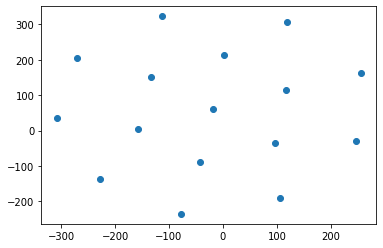

In [ ]:
plt.scatter(x[:,0],x[:,1])

torch.Size([40000, 512])


In [32]:

im.imsave('test.png',out[0])

In [37]:
df[1]

{'image_path': '/home/hyun_s/Gans/StyleGAN2_featuremap/g_image/1.png',
 'gradient_var': 1.8315368}